# Time Series & Neural Networks small project : Brazilian cities' temperature forecasting

  This project was done in collaboration with Davina LUXIMON for this small forecasting project done during a Time Series and Deep Learning course. It consists in trying and predicting the temperatures of several Brazilian cities from beginning 2017 to and 2019 thanks to Kaggle dataset found here :
  
  https://www.kaggle.com/volpatto/temperature-timeseries-for-some-brazilian-cities
  
  Let's start !

### IMPORTS

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels as sm
import datetime as dt
import tsfresh
import sktime 

import warnings 
warnings.filterwarnings("ignore")

## DATA GATHERING

   We are gathering here all the datasets available and stock them in a dictionnary where keys are the stations' name, and values their associated dataframe.

In [2]:
#PLEASE CHANGE YOUR PATH
dir_data = 'C:/Users/....../data'

data_brut = {}
for filename in os.listdir(dir_data):
    if filename.endswith(".csv"):
        variable_name = filename.split('.')[0]
        data_brut[variable_name] = pd.read_csv(os.path.join(dir_data,filename))

   How is it looking for the Curitiba station ?

In [3]:
data_brut['station_curitiba'].head(18)

,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC,D-J-F,M-A-M,J-J-A,S-O-N,metANN
0,1961,21.80,21.84,20.51,19.14,16.05,14.87,15.43,17.17,18.56,19.53,20.56,20.81,21.52,18.57,15.82,19.55,18.86
1,1962,20.47,20.29,20.78,17.42,14.49,12.19,12.29,14.85,16.46,15.48,19.07,20.01,20.52,17.56,13.11,17.00,17.05
2,1963,22.57,21.41,22.06,18.82,15.71,13.76,15.62,16.20,19.65,18.50,20.37,19.79,21.33,18.86,15.19,19.51,18.72
3,1964,21.33,21.57,20.29,19.26,15.46,13.03,12.08,14.97,16.93,17.28,17.76,19.47,20.90,18.34,13.36,17.32,17.48
4,1965,20.31,21.99,19.11,18.61,15.12,16.17,13.94,16.55,17.66,18.23,19.84,20.92,20.59,17.61,15.55,18.58,18.08
5,1966,22.30,22.84,21.36,18.62,16.50,15.38,15.30,14.07,15.43,17.32,19.19,21.13,22.02,18.83,14.92,17.31,18.27
6,1967,20.94,21.39,20.33,19.10,17.76,14.70,15.06,17.75,17.51,20.55,999.90,999.90,21.15,19.06,15.84,19.78,18.96
7,1968,999.90,999.90,999.90,999.90,999.90,999.90,999.90,999.90,999.90,999.90,999.90,21.74,999.90,999.90,999.90,999.90,999.90
8,1969,22.92,22.75,21.75,18.29,16.03,14.32,14.60,15.89,18.15,16.24,20.32,19.54,22.47,18.69,14.94,18.24,18.58
9,1970,21.37,22.55,21.27,18.81,17.67,15.04,13.69,13.41,15.76,17.63,17.93,21.93,21.15,19.25,14.05,17.11,17.89


   We kind of have a lot of cleansing and restructuration to do... Let's get through it !
   

## Data cleaning

First of all, it would be better to have dataframes looking longer than wider. So let's pivot them.

In [4]:
input_data = data_brut.copy()
for i in input_data.keys():
    input_data[i] = pd.melt(input_data[i], id_vars=['YEAR','metANN'], value_vars=['JAN','FEB','MAR','APR','MAY','JUN','JUL','AUG','SEP','OCT','NOV','DEC',], 
                            var_name='month',value_name='Temp')
    input_data[i]['Date'] = pd.to_datetime(input_data[i]['YEAR'].astype(str)+'/'+input_data[i]['month'].astype(str)+'/01')
    input_data[i].drop(['month','YEAR'], axis = 1, inplace = True )

   Moreover, putting the dates as datetime is better in order to apply our models.
    
   What is coming next is the creation of both annual average temperatures and monthly ones.

In [5]:
#CREATION OF TEMPERATURES & AVG_YEAR DATAFRAMES

temperatures = input_data.copy()
year_avg = data_brut.copy()

for i in input_data.keys():
    #BY MONTH
    temperatures[i] = input_data[i][['Date','Temp']]
    temperatures[i] = temperatures[i].set_index('Date')
    temperatures[i].sort_values(by='Date', inplace=True)
    
    #BY YEAR
    year_avg[i].drop(['JAN','FEB','MAR','APR','MAY','JUN','JUL','AUG','SEP','OCT','NOV','DEC', 'D-J-F', 'M-A-M', 'J-J-A', 'S-O-N', 'YEAR'], axis = 1, inplace = True )
    year_avg[i]['Date'] = pd.to_datetime(input_data[i]['Date'].astype(str))
    year_avg[i] = year_avg[i].set_index('Date')
    

In [6]:
stations = ['station_belem' , 'station_curitiba', 'station_fortaleza' ,'station_goiania','station_macapa','station_manaus','station_recife',
                    'station_rio', 'station_salvador','station_sao_luiz','station_sao_paulo','station_vitoria']


   After the changes in our data frame shapes, lets fill in the missing values. We decided to fill them in by taking the value just before the missing one. However, we can all agree on the fact that it is not the most ideal one to allow the prediction of future temepratures as it braks the trend of the time serie. 
   One way to remedy this would be to try and predict those missing values and to replace by them in the data frames.

In [7]:
for i in temperatures.keys():
    for j in temperatures[i].columns :
        temperatures[i][j] = temperatures[i][j].replace(999.90, np.NaN)
        temperatures[i][j] = temperatures[i][j].fillna(method = 'pad')
        
for i in year_avg.keys():
    for j in year_avg[i].columns :
        year_avg[i][j] = year_avg[i][j].replace(999.90, np.NaN)
        year_avg[i][j] = year_avg[i][j].fillna(method = 'pad')

That is what we are ending with as graphs, both for the monthly and annual values :

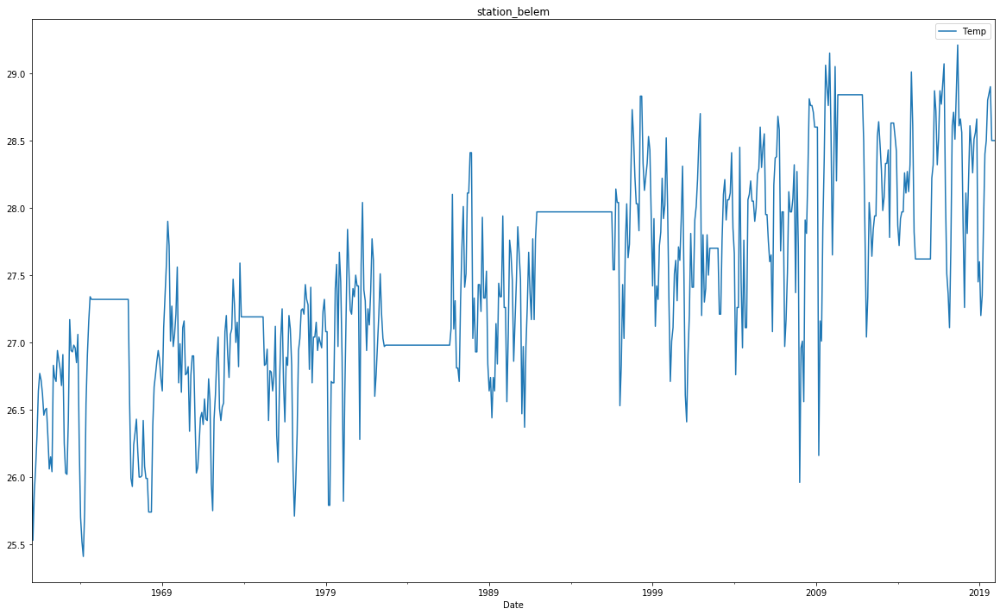

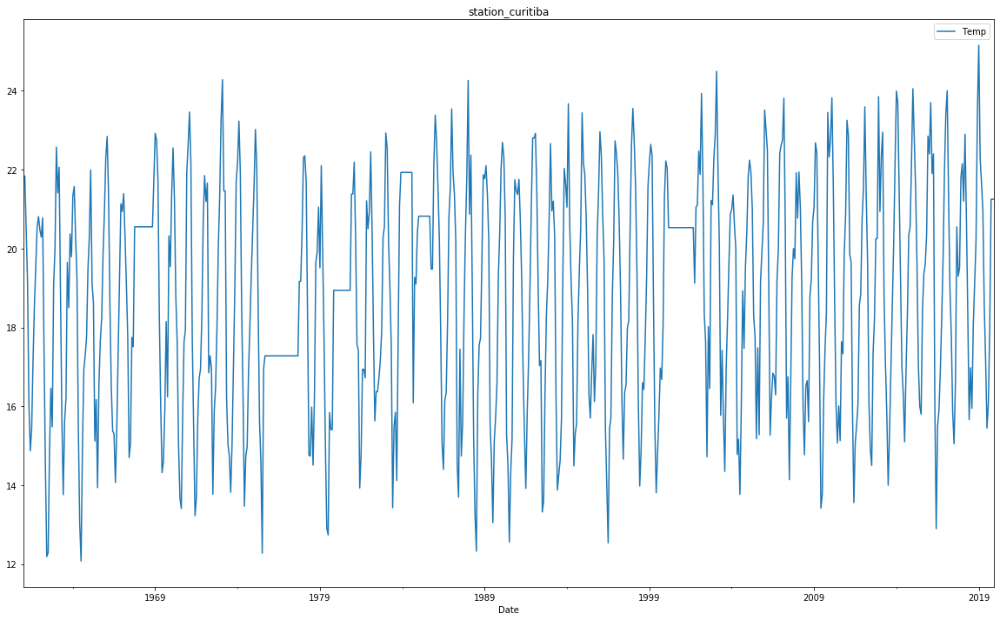

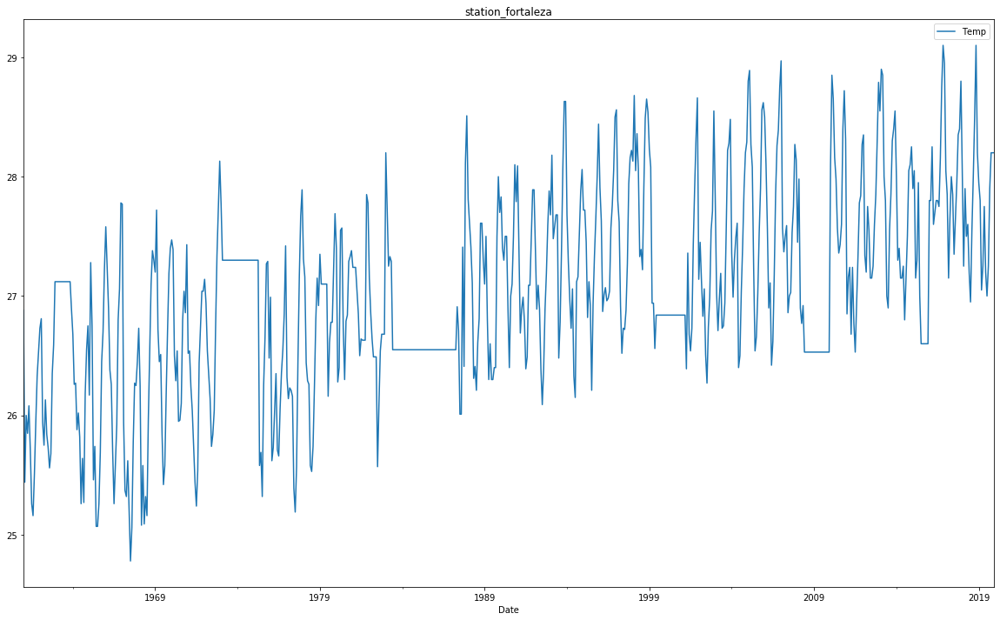

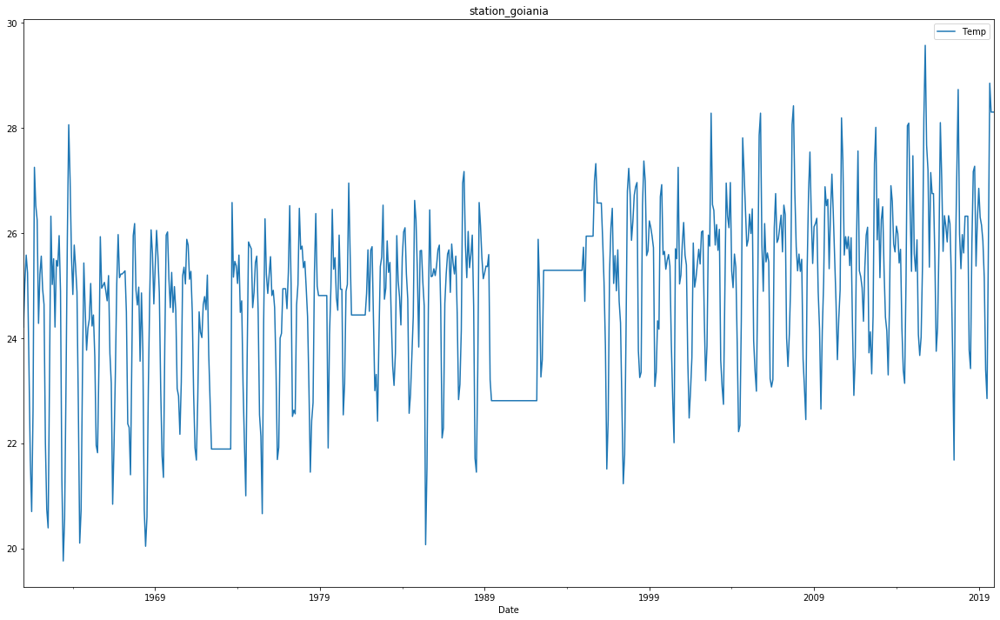

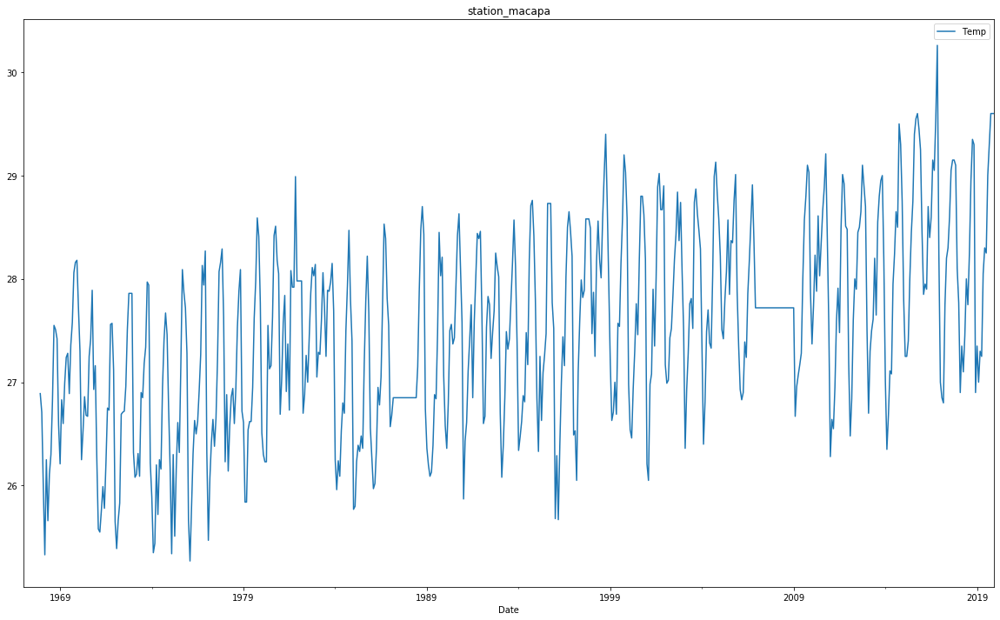

...

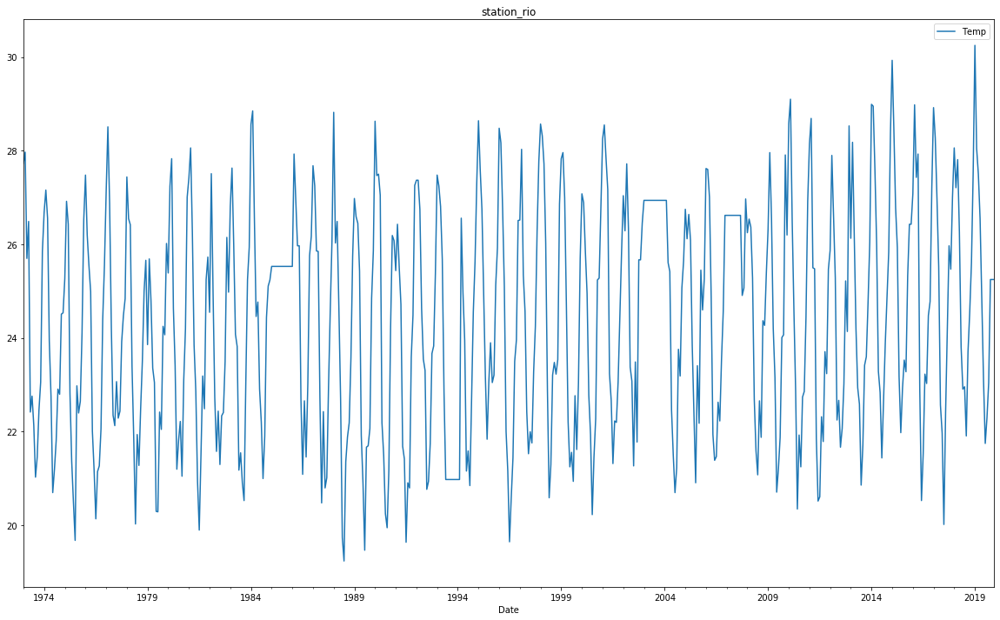

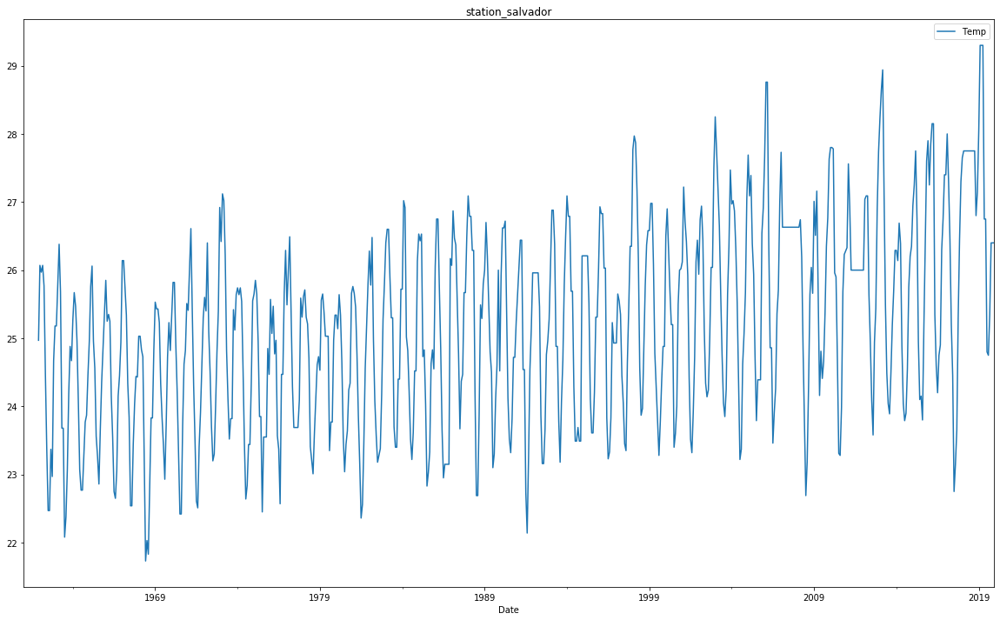

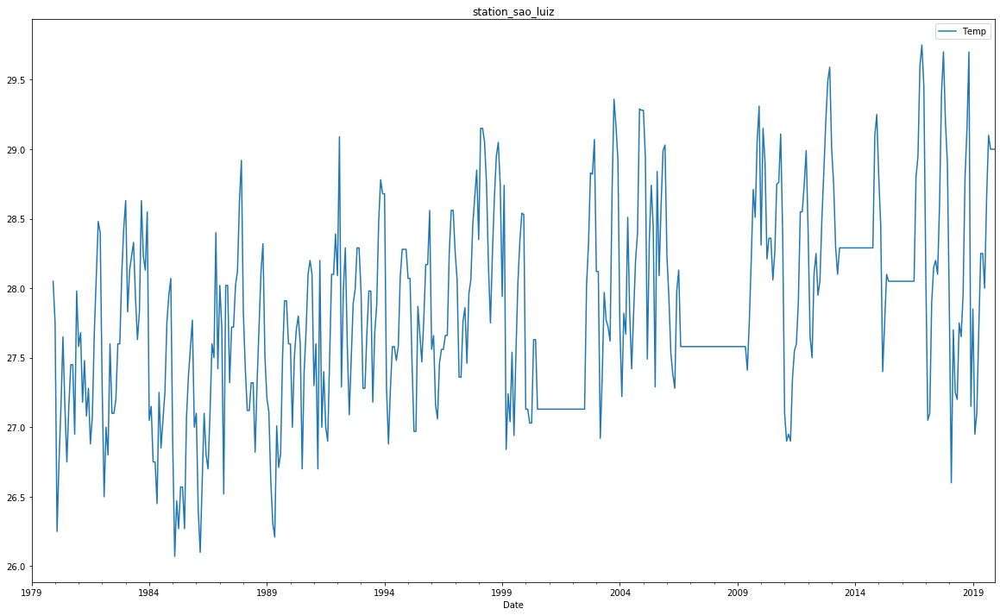

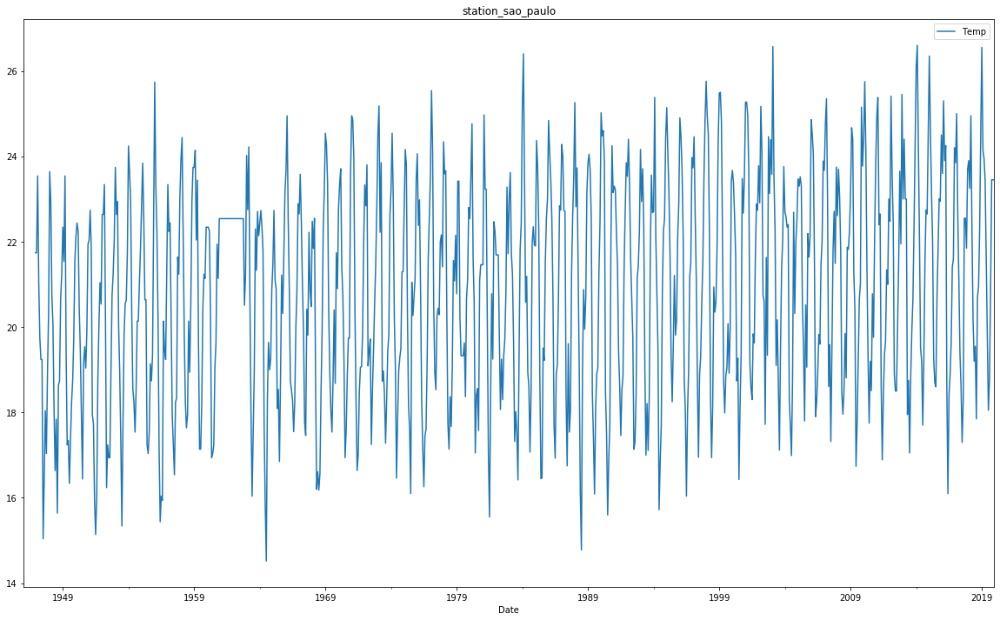

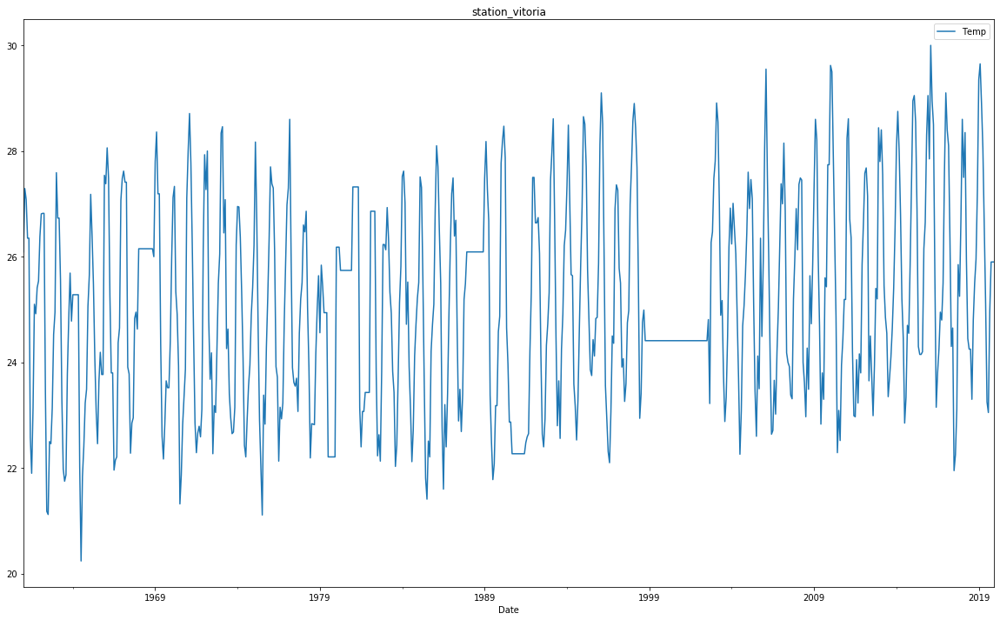

In [8]:
for i in temperatures :
    temperatures[i].plot(figsize=(20,12)).set_title(i)

   For this project, we will first try and what is going on for the Belem station.

In [9]:
belem = temperatures['station_belem']
belem_avg = year_avg['station_belem']

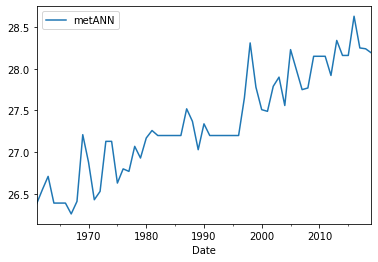

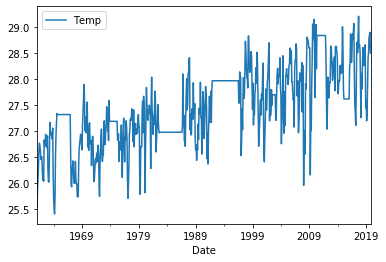

In [10]:
belem_avg.plot()
belem.plot()

### TIME SERIE DECOMPOSITION : TREND, SEASONNALITY AND RESIDUALS

   We wanted to use a statistical model in order to forecast our temperatures. Let's look at the decomposition of the signal.

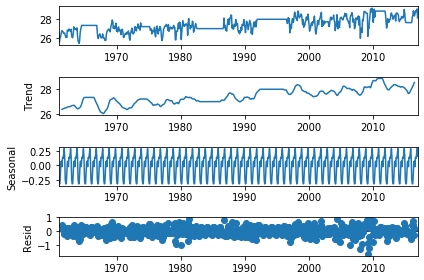

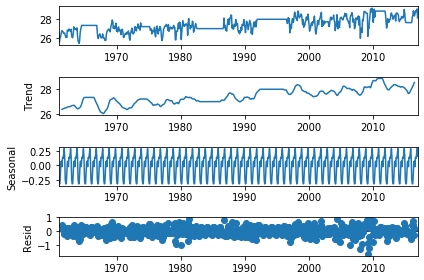

In [11]:
from statsmodels.tsa.seasonal import STL, seasonal_decompose

train_belem = belem[:-36]
test_belem = belem[-36:]

out = seasonal_decompose(train_belem)
out.plot()

We can see that a seasonnality appears and is of period of 12 months, it is an a priori we had. Since such a seasonnality exists, a statistical model that could work is a SARIMA. However, due to our lack of knowledge when it comes to the parameters of the model, we decided to avoid it and used an ARIMA instead.
Indeed, what we plan on doing is to remove the seasonnality from the original signal, and work with it for the ARIMA. After the prediction is provided, the seasonnality will be added back to it in order to get the final one ! 

Here is removed the seasonnality of our signal.

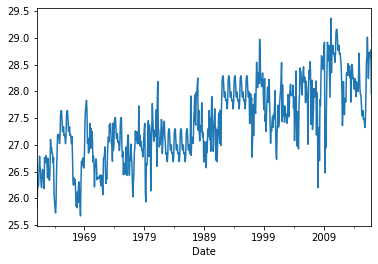

In [12]:
belem_no_seas = out.observed - out.seasonal
belem_no_seas.plot()

In order to know if the current signal is stationnary of not, we have to do an Augmented Dickey Fuller statistical test and check for its provided p-value for this signal.

In [13]:
from statsmodels.tsa.stattools import adfuller

adf = adfuller(belem_no_seas)
print("p-value afd : ", adf[1]) 

p-value afd :  2.3751940315814253e-09


The p-value indicates that there is no statistical evidence to prove that the current signal is not stationnary.

In order to get to know the parameters of the ARIMA model we will create, the plots of the (P)ACFs are needed.

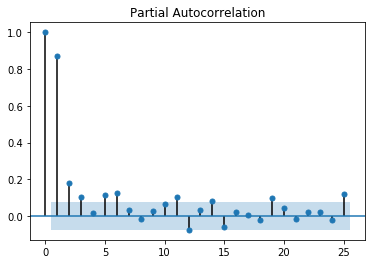

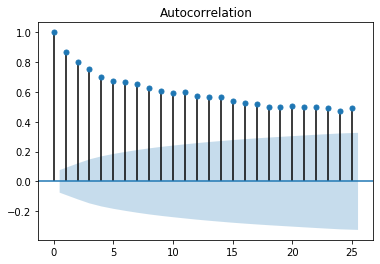

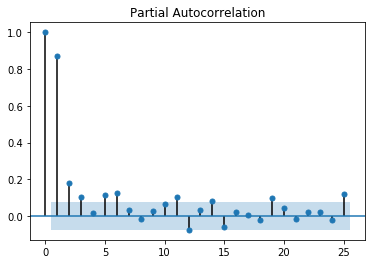

In [14]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plot_acf(belem_no_seas,lags=25)
plot_pacf(belem_no_seas,lags=25)

But it was not as easy for us to know which parameters to take for the model with these graphs. Instead, we plot the AICc values of several ARIMA models with different parameters thanks to a loop. We will then choose the model with the minimum AICc.

In [15]:
from statsmodels.tsa.arima.model import ARIMA 

In [16]:
for p in [1,2,3,4]:
    for q in [0, 1, 2, 3]:
        for d in [0, 1, 2, 3]:
            mod = ARIMA(belem_no_seas, order=(p,d,q))
            res = mod.fit()
            print("p={}, d={}, q={} --> AICc = {}".format(p,d,q, res.aicc))

p=1, d=0, q=0 --> AICc = 484.44389563987136
p=1, d=1, q=0 --> AICc = 482.2662070979557
p=1, d=2, q=0 --> AICc = 872.6703787773524
p=1, d=3, q=0 --> AICc = 1458.6758832074827
p=1, d=0, q=1 --> AICc = 453.6421287248518
p=1, d=1, q=1 --> AICc = 431.0618817238247
p=1, d=2, q=1 --> AICc = 491.47738053209247
p=1, d=3, q=1 --> AICc = 881.806048900651
p=1, d=0, q=2 --> AICc = 448.8198696653184
p=1, d=1, q=2 --> AICc = 425.05429160522414
p=1, d=2, q=2 --> AICc = 440.6322125712024
p=1, d=3, q=2 --> AICc = 508.5678282160791
p=1, d=0, q=3 --> AICc = 447.7418213529867
p=1, d=1, q=3 --> AICc = 426.9705836676314
p=1, d=2, q=3 --> AICc = 474.6081684390412
p=1, d=3, q=3 --> AICc = 471.99290147026437
p=2, d=0, q=0 --> AICc = 460.513058132937
p=2, d=1, q=0 --> AICc = 470.0456559893749
p=2, d=2, q=0 --> AICc = 741.2204336914132
p=2, d=3, q=0 --> AICc = 1188.43031858128
p=2, d=0, q=1 --> AICc = 436.7528512864679
p=2, d=1, q=1 --> AICc = 425.6615488706482
p=2, d=2, q=1 --> AICc = 479.5262587742971
p=2, d=3,

In comparason with all these AICc values, the one with the minimum seems to be the (4, 1, 3). So let's use it for our actual forecasting model.

In [17]:
mod = ARIMA(belem_no_seas, order=(4, 1, 3))
res = mod.fit()
residus = res.resid[2:]

In [18]:
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  672
Model:                 ARIMA(4, 1, 3)   Log Likelihood                -202.318
Date:                Tue, 24 Nov 2020   AIC                            420.636
Time:                        19:55:31   BIC                            456.707
Sample:                    01-01-1961   HQIC                           434.607
                         - 12-01-2016                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9731      0.045     21.655      0.000       0.885       1.061
ar.L2         -1.0172      0.056    -18.210      0.000      -1.127      -0.908
ar.L3          0.5082      0.051      9.922      0.000       0.408       0.609
ar.L4          0.0788      0.039      2.001      0.045       0.002       0.156
ma.L1         -1.3315      0.032    -41.109      0.000      -1.395      -1.268
ma.L2          1.3010      0.044     29.344      0.000       1.214       1.388
ma.L3         -0.9213      0.031    -29.552      0.000      -0.982      -0.860
sigma2         0.1066      0.004     25.206      0.000       0.098       0.115
===================================================================================
Ljung-Box (L1) (Q):                   0.14   Jarque-Bera (JB):               446.44
Prob(Q):                              0.71   Prob(JB):                         0.00
Heteroskedasticity (H):               2.04   Skew:                            -0.72
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.73
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

What we would also like to know is if our model actually does a good job at capturing all the information provided by the signal. That is why we perform a Ljung-Box test as well as a plot of the ACF for the residuals :

In [19]:
from statsmodels.stats.diagnostic import acorr_ljungbox
acorr_ljungbox(residus, lags=[10], return_df=True)


,lb_stat,lb_pvalue
10,5.618593,0.846225


The test's p-value being quite close to one, it is quite good at performing information capture. Let's confirm it with the residual ACF plot :

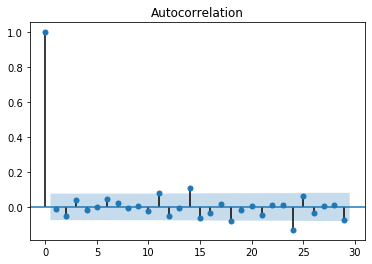

In [20]:
residus.plot(title="Résidus", figsize=(800,250) )
plot_acf(residus);

This plot shows that there is no more correlation with the residual, that is what we wanted !

Finally, lets stock our predictions and add the seasonnality back.

In [21]:
real = pd.DataFrame(test_belem)
pred = []
for i in range(0, 36) :
    pred.append(round(res.forecast(36)[i] + out.seasonal[0:36][i], 2))
real['pred'] = pred
print(real)

             Temp   pred
Date                    
2017-01-01  27.51  27.84
2017-02-01  27.36  27.71
2017-03-01  27.11  27.75
2017-04-01  27.71  28.01
2017-05-01  28.61  28.25
2017-06-01  28.71  28.22
2017-07-01  28.51  28.10
2017-08-01  28.86  28.30
2017-09-01  29.21  28.33
2017-10-01  28.61  28.37
2017-11-01  28.66  28.45
2017-12-01  28.56  28.31
2018-01-01  27.86  27.95
2018-02-01  27.26  27.88
2018-03-01  28.11  27.86
2018-04-01  27.81  28.01
2018-05-01  28.21  28.24
2018-06-01  28.61  28.27
2018-07-01  28.46  28.17
2018-08-01  28.26  28.31
2018-09-01  28.51  28.29
2018-10-01  28.56  28.37
2018-11-01  28.66  28.49
2018-12-01  27.45  28.34
2019-01-01  27.60  27.93
2019-02-01  27.20  27.85
2019-03-01  27.35  27.87
2019-04-01  27.90  28.04
2019-05-01  28.40  28.24
2019-06-01  28.50  28.25
2019-07-01  28.80  28.16
2019-08-01  28.85  28.33
2019-09-01  28.90  28.31
2019-10-01  28.50  28.36
2019-11-01  28.50  28.47
2019-12-01  28.50  28.34


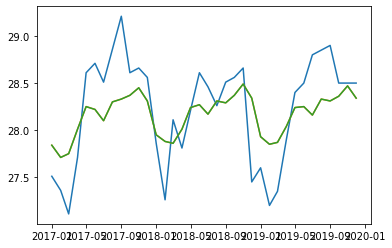

In [22]:
plt.plot(test_belem)
plt.plot(real['pred'])

In [29]:
mse = np.mean(np.square(real['Temp'].to_numpy() - real['pred'].to_numpy()))
print("RMSE : ",np.sqrt(mse))

RMSE :  0.4119162536244476


In [30]:
def mape(predictions, actuals):
    """Mean absolute percentage error"""
    return ((predictions - actuals).abs() / actuals).mean()
print("MAPE : ", mape(real['pred'], real['Temp']))

MAPE :  0.012318709232212576


### COMPARAISON WITH NAIVE MODEL


We can compare the results we obtained with a naive model defined as : 

 The prediction is the mean of the previous value and the ones from the year before as well as two and three years ago.

In [31]:
# Prédiction -> moyenne (valeur d'avant + valeur d'il y a 3 ans, 2 ans et 1 an)

def prediction_naive(train_belem, nb_mois) : 
    pred_naive = train_belem.copy().to_numpy()
    for i in range(0, nb_mois) :
        resultat = np.round((pred_naive[-1] + pred_naive[-12] + pred_naive[-24] + pred_naive[-36]) / 4, decimals = 2)
        pred_naive = np.append(pred_naive, resultat)
    return pred_naive[-nb_mois:]

res_naive = prediction_naive(train_belem, 36)
print(res_naive)

[27.86 27.86 27.93 28.1  28.1  28.08 28.08 28.21 28.18 28.26 28.49 28.21
 27.88 27.9  27.94 28.13 28.14 28.04 28.06 28.19 28.19 28.25 28.36 28.08
 27.86 27.96 28.04 28.29 28.31 28.19 28.21 28.37 28.38 28.45 28.59 28.25]


In [32]:
real['pred_naive'] = res_naive

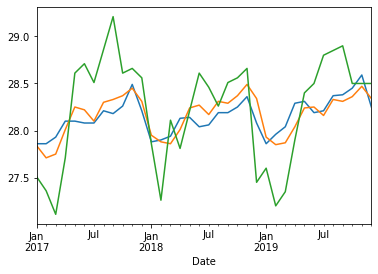

In [27]:
real['pred_naive'].plot() #pred naive -> première bleu
real['pred'].plot() #pred -> deuxieme orange
real['Temp'].plot() #dernier vert

In [28]:
mse = np.mean(np.square(real['Temp'].to_numpy() - real['pred_naive'].to_numpy()))
print("RMSE : ", np.sqrt(mse))
print("MAPE : ", mape(real['pred_naive'], real['Temp']))

RMSE :  0.4659876011702933
MAPE :  0.014277060474504659


That is how we conclude this project !

### FUTURE WORKS

Some future works could be to generalise this model to the whole dictionnary of data frames for which their missing values would be filled properly with a bootstrapping method. Moreover, a use of a SARIMA model can be done.